In [2]:
import os
import numpy as np
import random
from scipy.signal import convolve2d # 尽管在这个片段中没有直接使用，但保留以防后续代码使用
import mujoco as mj
import mediapy as media
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors # 尽管在这个片段中没有直接使用，但保留以防后续代码使用
import pygments
import pygments.lexers
import pygments.formatters

# --- MuJoCo GPU 渲染配置 (可选，但推荐在支持GPU的环境下设置) ---
# 在本地环境中，通常不需要像Colab那样复杂的ICD配置。
# 确保你的NVIDIA驱动已正确安装。
# 设置环境变量，强制MuJoCo使用EGL渲染后端（需要GPU支持）
# 如果你的系统没有GPU或EGL配置有问题，可以注释掉这行，MuJoCo会尝试使用CPU渲染。
print('Setting environment variable to use GPU rendering (if available):')
os.environ['MUJOCO_GL'] = 'egl'

# --- 检查 MuJoCo 安装是否成功 ---
try:
    print('Checking that the MuJoCo installation succeeded:')
    # 尝试导入 MuJoCo 并创建一个简单的空模型来验证
    mj.MjModel.from_xml_string('<mujoco/>')
    print('MuJoCo installation successful.')
except Exception as e:
    print(f'Error: Something went wrong during MuJoCo installation or setup: {e}')
    print('Please ensure MuJoCo Python package is installed (`pip install mujoco`)')
    print('and your system has necessary GPU drivers (if using GPU rendering).')
    exit() # 如果安装失败，则退出脚本

# --- 其他辅助库的配置 ---
# 更清晰的 NumPy 打印输出
np.set_printoptions(precision=3, suppress=True, linewidth=100)

print('FFmpeg and Mediapy are required for video/image rendering.')
print('Please ensure FFmpeg is installed and accessible in your system PATH.')

# --- 修改后的 print_xml 函数 (在本地终端直接打印) ---
def print_xml(xml_string):
    # 在本地终端，我们无法像Colab那样渲染HTML高亮。
    # 这里我们直接打印XML字符串，或者你可以选择使用pygments在终端进行高亮（更复杂）
    print("\n--- XML Definition ---")
    # 如果你想在终端看到一些高亮效果，可以尝试：
    # from pygments.console import ansicolor
    # print(ansicolor(pygments.highlight(xml_string, pygments.lexers.XmlLexer(), pygments.formatters.TerminalFormatter())))
    # 但最简单直接的方式是：
    print(xml_string)
    print("----------------------\n")


# --- 修改后的 render 函数 (保存图像到文件) ---
def render(model, data=None, height=300, camera=-1, output_filename='rendered_frame.png'):
    """
    渲染 MuJoCo 模型的一个帧并保存为图片文件。
    Args:
        model: MuJoCo MjModel 对象。
        data: MuJoCo MjData 对象。如果为 None，则创建一个新的。
        height: 渲染图像的高度 (像素)。宽度将根据宽高比自动调整。
        camera: 摄像机ID或名称，用于渲染。-1 表示默认摄像机。
        output_filename: 保存渲染图像的文件名。
    """
    if data is None:
        data = mj.MjData(model)

    # 渲染器尺寸通常需要明确指定，这里使用一个合理的默认值
    # 注意：renderer.render() 返回的像素数组尺寸将与这里设置的尺寸一致
    # 假设我们想要一个接近正方形的输出，或者根据 height 调整 width
    render_width = int(height * (4/3)) # 常见的宽高比，可以调整
    renderer = mj.Renderer(model, render_width, height)

    try:
        mj.mj_forward(model, data) # 执行一次前向动力学，更新场景状态
        renderer.update_scene(data, camera) # 更新渲染场景
        pixels = renderer.render()  # 获取当前帧的像素数据 (NumPy 数组)

        # 将像素数据保存为图片文件
        media.write_image(output_filename, pixels)
        print(f"Rendered frame saved to: {os.path.abspath(output_filename)}")
    except Exception as e:
        print(f"Error during rendering or saving image: {e}")
        print("Please ensure FFmpeg is installed and accessible in your system PATH for image/video saving.")
    finally:
        renderer.close() # 确保渲染器资源被释放



Setting environment variable to use GPU rendering (if available):
Checking that the MuJoCo installation succeeded:
MuJoCo installation successful.
FFmpeg and Mediapy are required for video/image rendering.
Please ensure FFmpeg is installed and accessible in your system PATH.


In [3]:
#@title Parse, compile, modify, compile: {vertical-output: true}

static_model = """
<mujoco>
  <worldbody>
    <light name="top" pos="0 0 1"/>
    <geom name="red_box" type="box" size=".2 .2 .2" rgba="1 0 0 1"/>
    <geom name="green_sphere" pos=".2 .2 .2" size=".1" rgba="0 1 0 1"/>
  </worldbody>
</mujoco>
"""
spec = mj.MjSpec.from_string(static_model)
model = spec.compile()
render(model)

# Change the mjSpec, re-compile and re-render
spec.modelname = "edited model"
geoms = spec.worldbody.find_all(mj.mjtObj.mjOBJ_GEOM)
geoms[0].name = 'blue_box'
geoms[0].rgba = [0, 0, 1, 1]
geoms[1].name = 'yellow_sphere'
geoms[1].rgba = [1, 1, 0, 1]
spec.worldbody.add_geom(name='magenta cylinder',
                        type=mj.mjtGeom.mjGEOM_CYLINDER,
                        rgba=[1, 0, 1, 1],
                        pos=[-.2, 0, .2],
                        size=[.1, .1, 0])

model = spec.compile()
render(model)

Rendered frame saved to: c:\Users\13613\Desktop\Naoji\EEG-ATCNet\ZHUSHI\rendered_frame.png
Rendered frame saved to: c:\Users\13613\Desktop\Naoji\EEG-ATCNet\ZHUSHI\rendered_frame.png


In [4]:
#@title {vertical-output: true}

spec = mj.MjSpec()
spec.worldbody.add_light(name="top", pos=[0, 0, 1])
body = spec.worldbody.add_body(name="box_and_sphere",
                               euler=[0, 0, -30])
body.add_joint(name="swing", type=mj.mjtJoint.mjJNT_HINGE,
               axis=[1, -1, 0], pos=[-.2, -.2, -.2])
body.add_geom(name="red_box", type=mj.mjtGeom.mjGEOM_BOX,
              size=[.2, .2, .2], rgba=[1, 0, 0, 1])
body.add_geom(name="green_sphere", pos=[.2, .2, .2],
              size=[.1, 0, 0], rgba=[0, 1, 0, 1])
model = spec.compile()

duration = 2    # (seconds)
framerate = 30  # (Hz)

# enable joint visualization option:
scene_option = mj.MjvOption()
scene_option.flags[mj.mjtVisFlag.mjVIS_JOINT] = True

# Simulate and display video.
frames = []
data = mj.MjData(model)
mj.mj_resetData(model, data)
with mj.Renderer(model) as renderer:
  while data.time < duration:
    mj.mj_step(model, data)
    if len(frames) < data.time * framerate:
      renderer.update_scene(data, scene_option=scene_option)
      pixels = renderer.render()
      frames.append(pixels)

media.show_video(frames, fps=framerate)

In [5]:
#@title Utilities
def branch_frames(num_samples, phi_lower=np.pi / 8, phi_upper=np.pi / 3):
  """Returns branch direction vectors and normalized attachment heights."""
  directions = []
  theta_slice = (2 * np.pi) / num_samples
  phi_slice = (phi_upper - phi_lower) / num_samples
  for i in range(num_samples):
    theta = np.random.uniform(i * theta_slice, (i + 1) * theta_slice)
    phi = phi_lower + np.random.uniform(i * phi_slice, (i + 1) * phi_slice)
    x = np.sin(phi) * np.cos(theta)
    y = np.sin(phi) * np.sin(theta)
    z = np.cos(phi)
    directions.append([x, y, z])

  heights = np.linspace(0.6, 1, num_samples)

  return directions, heights


def add_arrow(scene, from_, to, radius=0.03, rgba=[0.2, 0.2, 0.6, 1]):
  """Add an arrow to the scene."""
  scene.geoms[scene.ngeom].category = mj.mjtCatBit.mjCAT_STATIC
  mj.mjv_initGeom(
      geom=scene.geoms[scene.ngeom],
      type=mj.mjtGeom.mjGEOM_ARROW,
      size=np.zeros(3),
      pos=np.zeros(3),
      mat=np.zeros(9),
      rgba=np.asarray(rgba).astype(np.float32),
  )
  mj.mjv_connector(
      geom=scene.geoms[scene.ngeom],
      type=mj.mjtGeom.mjGEOM_ARROW,
      width=radius,
      from_=from_,
      to=to,
  )
  scene.ngeom += 1


def unit_bump(x, start, end):
  """Finite-support unit bump function."""
  if x <= start or x >= end:
    return 0.0
  else:
    n = (x - start) / (end - start)
    n = 2 * n - 1
    return np.exp(n * n / (n * n - 1))

In [6]:
# @title Tree creation
def procedural_tree(
    num_child_branch=5,
    length=0.5,
    thickness=0.04,
    depth=4,
    this_body=None,
    spec=None,
):
  """Recursive function that builds a tree of branches and leaves."""
  BROWN = np.array([0.4, 0.24, 0.0, 1])
  GREEN = np.array([0.0, 0.7, 0.2, 1])
  SCALE = 0.6

  # Initialize spec and add tree trunk
  if this_body is None:
    if spec is None:
      spec = mj.MjSpec()

    # Disable constraints
    spec.option.disableflags |= mj.mjtDisableBit.mjDSBL_CONSTRAINT

    # Air density
    spec.option.density = 1.294

    # Defaults for joint and geom
    main = spec.default
    main.geom.type = mj.mjtGeom.mjGEOM_CAPSULE
    main.joint.type = mj.mjtJoint.mjJNT_BALL
    main.joint.springdamper = [0.003, 0.7]

    # Visual
    spec.stat.center = [0, 0, length]
    spec.stat.extent = 2 * length

    # Add trunk body
    this_body = spec.worldbody.add_body(name="trunk")
    fromto = [0, 0, 0, 0, 0, length]
    size = [thickness, 0, 0]
    this_body.add_geom(fromto=fromto, size=size, rgba=BROWN)

  # Sample a random color
  rgba = np.random.uniform(size=4)
  rgba[3] = 1

  # Add child branches using recursive call
  if depth > 0:
    # Get branch direction vectors and attachment heights
    dirs, heights = branch_frames(num_child_branch)
    heights *= length

    # Rescale branches with some randomness
    thickness *= SCALE * np.random.uniform(0.9, 1.1)
    length *= SCALE * np.random.uniform(0.9, 1.1)

    # Branch creation
    for i in range(num_child_branch):
      branch = this_body.add_body(pos=[0, 0, heights[i]], zaxis=dirs[i])

      fromto = [0, 0, 0, 0, 0, length]
      size = [thickness, 0, 0]
      rgba = (rgba + BROWN) / 2
      branch.add_geom(fromto=fromto, size=size, rgba=rgba)

      branch.add_joint()

      # Recurse.
      procedural_tree(
          length=length,
          thickness=thickness,
          depth=depth - 1,
          this_body=branch,
          spec=spec,
      )

  # Max depth reached, add three leaves at the tip
  else:
    rgba = (rgba + GREEN) / 2
    for i in range(3):
      pos = [0, 0, length + thickness]
      euler = [0, 0, i * 120]
      leaf_frame = this_body.add_frame(pos=pos, euler=euler)

      size = length * np.array([0.5, 0.15, 0.01])
      pos = length * np.array([0.45, 0, 0])
      ellipsoid = mj.mjtGeom.mjGEOM_ELLIPSOID
      euler = [np.random.uniform(-50, 50), 0, 0]
      leaf = this_body.add_geom(
          type=ellipsoid, size=size, pos=pos, rgba=rgba, euler=euler
      )

      leaf.set_frame(leaf_frame)

  return spec

In [7]:
#@title Make video
arena_xml = """
<mujoco>
  <visual>
    <headlight diffuse=".5 .5 .5" specular="1 1 1"/>
    <global elevation="-10" offwidth="2048" offheight="1536"/>
    <quality shadowsize="8192"/>
  </visual>

  <asset>
    <texture type="skybox" builtin="gradient" rgb1=".5 .5 .5" rgb2="0 0 0" width="10" height="10"/>
    <texture type="2d" name="groundplane" builtin="checker" mark="edge" rgb1="1 1 1" rgb2="1 1 1" markrgb="0 0 0" width="300" height="300"/>
    <material name="groundplane" texture="groundplane" texuniform="true" texrepeat="5 5" reflectance="0.3"/>
  </asset>

  <worldbody>
    <geom name="floor" size="5 5 0.01" type="plane" material="groundplane"/>
    <light pos="0 0 3" diffuse="1 1 1" specular="1 1 1"/>
  </worldbody>
</mujoco>
"""

spec = procedural_tree(spec=mj.MjSpec.from_string(arena_xml))
model = spec.compile()
data = mj.MjData(model)

duration = 3  # (seconds)
framerate = 60  # (Hz)
frames = []
with mj.Renderer(model, width=1920 // 3, height=1080 // 3) as renderer:
  while data.time < duration:
    # Add rightward wind.
    wind = 40 * unit_bump(data.time, .2 * duration, .7 * duration)
    model.opt.wind[0] = wind

    # Step and render.
    mj.mj_step(model, data)
    if len(frames) < data.time * framerate:
      renderer.update_scene(data)
      if wind > 0:
        add_arrow(renderer.scene, [0, 0, 1], [wind/25, 0, 1])
      pixels = renderer.render()
      frames.append(pixels)

media.show_video(frames, fps=framerate / 2)

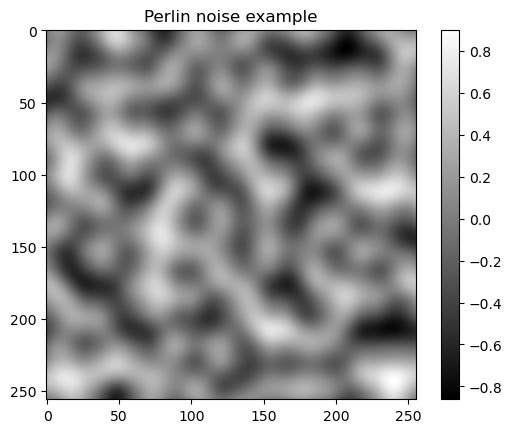

In [11]:
#@title Perlin noise generator

# adapted from https://github.com/pvigier/perlin-numpy

def interpolant(t):
    return t*t*t*(t*(t*6 - 15) + 10)

def perlin(shape, res, tileable=(False, False), interpolant=interpolant):
  """Generate a 2D numpy array of perlin noise.

  Args:
      shape: The shape of the generated array (tuple of two ints).
          This must be a multiple of res.
      res: The number of periods of noise to generate along each
          axis (tuple of two ints). Note shape must be a multiple of
          res.
      tileable: If the noise should be tileable along each axis
          (tuple of two bools). Defaults to (False, False).
      interpolant: The interpolation function, defaults to
          t*t*t*(t*(t*6 - 15) + 10).

  Returns:
      A numpy array of shape shape with the generated noise.

  Raises:
      ValueError: If shape is not a multiple of res.
  """
  delta = (res[0] / shape[0], res[1] / shape[1])
  d = (shape[0] // res[0], shape[1] // res[1])
  grid = np.mgrid[0:res[0]:delta[0], 0:res[1]:delta[1]]\
            .transpose(1, 2, 0) % 1
  # Gradients
  angles = 2*np.pi*np.random.rand(res[0]+1, res[1]+1)
  gradients = np.dstack((np.cos(angles), np.sin(angles)))
  if tileable[0]:
    gradients[-1,:] = gradients[0,:]
  if tileable[1]:
    gradients[:,-1] = gradients[:,0]
  gradients = gradients.repeat(d[0], 0).repeat(d[1], 1)
  g00 = gradients[    :-d[0],    :-d[1]]
  g10 = gradients[d[0]:     ,    :-d[1]]
  g01 = gradients[    :-d[0],d[1]:     ]
  g11 = gradients[d[0]:     ,d[1]:     ]
  # Ramps
  n00 = np.sum(np.dstack((grid[:,:,0]  , grid[:,:,1]  )) * g00, 2)
  n10 = np.sum(np.dstack((grid[:,:,0]-1, grid[:,:,1]  )) * g10, 2)
  n01 = np.sum(np.dstack((grid[:,:,0]  , grid[:,:,1]-1)) * g01, 2)
  n11 = np.sum(np.dstack((grid[:,:,0]-1, grid[:,:,1]-1)) * g11, 2)
  # Interpolation
  t = interpolant(grid)
  n0 = n00*(1-t[:,:,0]) + t[:,:,0]*n10
  n1 = n01*(1-t[:,:,0]) + t[:,:,0]*n11
  return np.sqrt(2)*((1-t[:,:,1])*n0 + t[:,:,1]*n1)

noise = perlin((256, 256), (8, 8))
plt.imshow(noise, cmap = 'gray', interpolation = 'lanczos')
plt.title('Perlin noise example')
plt.colorbar();

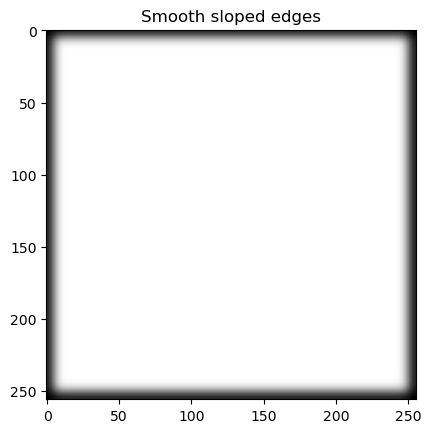

In [13]:
#@title Soft edge slope
def edge_slope(size, border_width=5, blur_iterations=20):
  """Creates a grayscale image with a white center and fading black edges using convolution."""
  img = np.ones((size, size), dtype=np.float32)
  img[:border_width, :] = 0
  img[-border_width:, :] = 0
  img[:, :border_width] = 0
  img[:, -border_width:] = 0

  kernel = np.array([[1, 1, 1],
                      [1, 1, 1],
                      [1, 1, 1]]) / 9.0

  for _ in range(blur_iterations):
    img = convolve2d(img, kernel, mode='same', boundary='symm')

  return img

image = edge_slope(256)
plt.imshow(image, cmap='gray')
plt.title('Smooth sloped edges')
plt.show()

In [14]:
def add_hfield(spec=None, hsize=10, vsize=4):
  """ Function that adds a height field with contours"""

  # Initialize spec
  if spec is None:
    spec = mj.MjSpec()

  # Generate Perlin noise
  size = 128
  noise = perlin((size, size), (8, 8))

  # Remap noise to 0 to 1
  noise = (noise + 1)/2
  noise -= np.min(noise)
  noise /= np.max(noise)

  # Makes the edges slope down to avoid sharp boundary
  noise *= edge_slope(size)

  # Create height field
  hfield = spec.add_hfield(name ='hfield',
                           size = [hsize, hsize, vsize, vsize/10],
                           nrow = noise.shape[0],
                           ncol = noise.shape[1],
                           userdata = noise.flatten())

  # Add texture
  texture = spec.add_texture(name = "contours",
                             type = mj.mjtTexture.mjTEXTURE_2D,
                             width = 128, height = 128)

  # Create texture map, assign to texture
  h = noise
  s = 0.7 * np.ones(h.shape)
  v = 0.7 * np.ones(h.shape)
  hsv = np.stack([h, s, v], axis=-1)
  rgb = mcolors.hsv_to_rgb(hsv)
  rgb = np.flipud((rgb * 255).astype(np.uint8))
  texture.data = rgb.tobytes()

  # Assign texture to material
  grid = spec.add_material( name = 'contours')
  grid.textures[mj.mjtTextureRole.mjTEXROLE_RGB] = 'contours'
  spec.worldbody.add_geom(type = mj.mjtGeom.mjGEOM_HFIELD,
                          material = 'contours', hfieldname = 'hfield')

  return spec

In [15]:
#@title Video

arena_xml = """
<mujoco>
  <visual>
    <headlight diffuse=".5 .5 .5" specular="1 1 1"/>
    <global offwidth="2048" offheight="1536"/>
    <quality shadowsize="8192"/>
  </visual>

  <asset>
    <texture type="skybox" builtin="gradient" rgb1="1 1 1" rgb2="1 1 1" width="10" height="10"/>
    <texture type="2d" name="groundplane" builtin="checker" mark="edge" rgb1="1 1 1" rgb2="1 1 1" markrgb="0 0 0" width="400" height="400"/>
    <material name="groundplane" texture="groundplane" texrepeat="45 45" reflectance="0"/>
  </asset>

  <worldbody>
    <geom name="floor" size="150 150 0.1" type="plane" material="groundplane"/>
  </worldbody>
</mujoco>
"""

spec = add_hfield(mj.MjSpec.from_string(arena_xml))

# Add lights
for x in [-15, 15]:
  for y in [-15, 15]:
    spec.worldbody.add_light(pos = [x, y, 10], dir = [-x, -y, -15])

# Add balls
for x in np.linspace(-8, 8, 8):
  for y in np.linspace(-8, 8, 8):
    pos = [x, y, 4 + np.random.uniform(0, 10)]
    ball = spec.worldbody.add_body(pos=pos)
    ball.add_geom(type = mj.mjtGeom.mjGEOM_SPHERE, size = [0.5, 0, 0],
                  rgba = [np.random.uniform()]*3 + [1])
    ball.add_freejoint()

model = spec.compile()
data = mj.MjData(model)

cam = mj.MjvCamera()
mj.mjv_defaultCamera(cam)
cam.lookat = [0, 0, 0]
cam.distance = 30
cam.elevation = -30

duration = 6  # (seconds)
framerate = 60  # (Hz)
frames = []
with mj.Renderer(model, width=1920 // 3, height=1080 // 3) as renderer:
  while data.time < duration:
    mj.mj_step(model, data)
    if len(frames) < data.time * framerate:
      cam.azimuth = 20 + 20 * (1 - np.cos(np.pi*data.time / duration))
      renderer.update_scene(data, cam)
      pixels = renderer.render()
      frames.append(pixels)

media.show_video(frames, fps=framerate )

# mesh


In [18]:
#@title Add "rock" mesh
def add_rock(spec=None, scale=1, name="rock", pos=[0, 0, 0]):
  if spec is None:
    spec = mj.MjSpec()

  # Defaults
  main = spec.default
  main.mesh.scale = np.array([scale]*3 , dtype = np.float64)
  main.geom.type = mj.mjtGeom.mjGEOM_MESH

  # Random gray-brown color
  gray = np.array([.5, .5, .5, 1])
  light_brown = np.array([200, 150, 100, 255]) / 255.0
  mix = np.random.uniform()
  rgba = light_brown*mix + gray*(1-mix)

  # Create mesh vertices
  mesh = np.random.normal(size = (20, 3))
  mesh /= np.linalg.norm(mesh, axis=1, keepdims=True)

  # Create Body and add mesh to the Geom of the Body
  spec.add_mesh(name=name, uservert=mesh.flatten())
  body = spec.worldbody.add_body(pos=pos, name=name, mass=1)
  body.add_geom(meshname=name, rgba=rgba)
  body.add_freejoint()

  return body

In [19]:
#@title Video
spec = add_hfield(mj.MjSpec.from_string(arena_xml))

# Add lights
for x in [-15, 15]:
  for y in [-15, 15]:
    spec.worldbody.add_light(pos = [x, y, 10], dir = [-x, -y, -15])

# Add rocks
for x in np.linspace(-8, 8, 8):
  for y in np.linspace(-8, 8, 8):
    pos = [x, y, np.random.uniform(4, 14)]
    rock = add_rock(spec = spec,
                      scale = np.random.uniform(.3, 1),
                      name = f"rock_{x}_{y}",
                      pos = pos)
model = spec.compile()
data = mj.MjData(model)

cam = mj.MjvCamera()
mj.mjv_defaultCamera(cam)
cam.lookat = [0, 0, 0]
cam.distance = 30
cam.elevation = -30

duration = 6  # (seconds)
framerate = 60  # (Hz)
frames = []
with mj.Renderer(model, width=1920 // 3, height=1080 // 3) as renderer:
  while data.time < duration:
    mj.mj_step(model, data)
    if len(frames) < data.time * framerate:
      cam.azimuth = 20 + 20 * (1 - np.cos(np.pi*data.time / duration))
      renderer.update_scene(data, cam)
      pixels = renderer.render()
      frames.append(pixels)

media.show_video(frames, fps=framerate )